## Домашнее задание №1 по курсу компьютерного зрения (3D ML)
>Выполнил: Ларин А.В.<br>
>Группа: М8О-103М-20

### Задание:
Получить изображения вашей 3D модели в разных представлениях (полигональный меш, воксельное представление, облако точек, семплирования SDF).

Установка окружения и импорт библиотек:

In [3]:
#!pip install mesh_to_sdf pyrender trimesh
#!pip install torch torchvision
#!pip install git+https://github.com/facebookresearch/pytorch3d.git@v0.2.0

In [3]:
import os
os.environ['PYOPENGL_PLATFORM'] = 'egl'
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

import torch

# untilitis 
from pytorch3d.utils import ico_sphere

# loss functions and regulaziers
from pytorch3d.loss import (
    chamfer_distance,
    mesh_edge_loss,
    mesh_laplacian_smoothing,
    mesh_normal_consistency
)

# io utils
from pytorch3d.io import load_obj

# operations with data
from pytorch3d.ops import sample_points_from_meshes

# datastructures
from pytorch3d.structures import Meshes, Textures

# render 
from pytorch3d.renderer import (
    look_at_view_transform,
    OpenGLPerspectiveCameras,
    DirectionalLights, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    HardPhongShader
)

# mesh_to_sdf lib by marian42
from mesh_to_sdf import mesh_to_sdf, sample_sdf_near_surface

# trimesh lib imports
import trimesh
from trimesh.voxel.creation import voxelize

Выбор среды выполнения

In [4]:
# If you have got a CUDA device, you can use GPU mode
if torch.cuda.is_available():
  device = torch.device('cuda:0')
  torch.cuda.set_device(device)
else:
  device = torch.device('cpu')

Создание пути к obj-модели

In [6]:
#!mkdir models

In [7]:
model_path = os.path.join("models", "Porsche_911_GT2.obj")

### Полигональная модель

In [8]:
# Trimesh Porche_911_GT2.obj model
car_trimesh = trimesh.load(model_path)

if isinstance(car_trimesh, trimesh.Scene):
    car_trimesh = car_trimesh.dump(concatenate=True)

car_trimesh.vertices -= car_trimesh.center_mass
scaling = 2 / car_trimesh.scale
car_trimesh.apply_scale(scaling=scaling)

verts, faces_idx, _ = load_obj(model_path)
faces = faces_idx.verts_idx

center = verts.mean(0)
verts = verts - center
scale = max(verts.abs().max(0)[0])
verts = verts / scale

# Initialize each vertex to be white in color.
verts_rgb = torch.ones_like(verts)[None]  # (1, V, 3)

textures = Textures(verts_rgb=verts_rgb.to(device))

# Create a Meshes object for the car
car_mesh = Meshes(
    verts=[verts.to(device)],   
    faces=[faces.to(device)], 
    textures=textures
)

In [9]:
# Initialize an OpenGL perspective camera.
cameras = OpenGLPerspectiveCameras(device=device)

# We will also create a phong renderer. This is simpler and only needs to render one face per pixel.
raster_settings = RasterizationSettings(
    image_size=1024, 
    blur_radius=0, 
    faces_per_pixel=1, 
)

# We can add a point light in front of the object. 
#lights = PointLights(device=device, location=((2.0, 2.0, -2.0),))
ambient_color = torch.FloatTensor([[0.0, 0.0, 0.0]]).to(device)
diffuse_color = torch.FloatTensor([[1.0, 1.0, 1.0]]).to(device)
specular_color = torch.FloatTensor([[0.1, 0.1, 0.1]]).to(device)
direction = torch.FloatTensor([[1, 1, 1]]).to(device)
lights = DirectionalLights(ambient_color=ambient_color,
                           diffuse_color=diffuse_color,
                           specular_color=specular_color,
                           direction=direction,
                           device=device)

phong_renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=HardPhongShader(
        device=device, 
        cameras=cameras, 
        lights=lights
        )
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


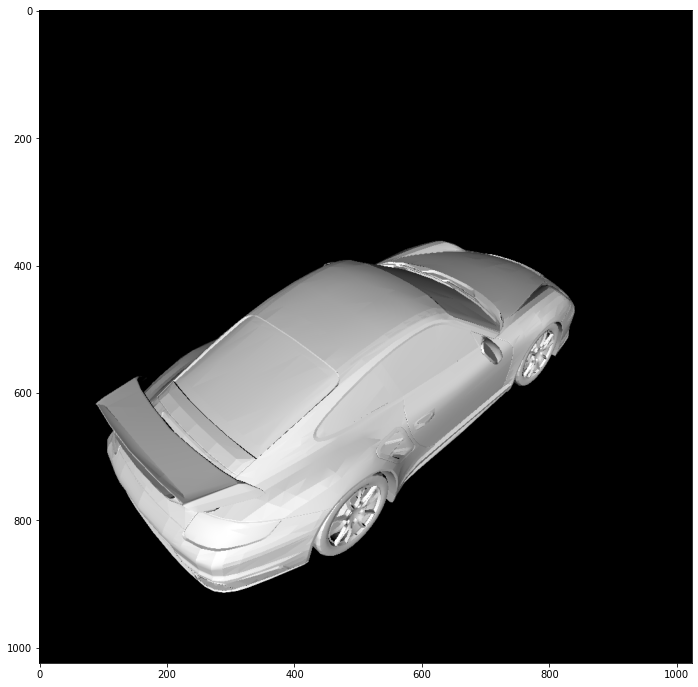

In [10]:
# Select the viewpoint using spherical angles  
distance = 2.0    # distance from camera to the object`
elevation = 40.0  # angle of elevation in degrees
azimuth = 45.0    # rotation

# Get the position of the camera based on the spherical angles
R, T = look_at_view_transform(distance, elevation, azimuth, device = device, at = ((-0.02, 0.1, 0.0),))

# Render the Campfire providing the values of R and T.
car_image = phong_renderer(meshes_world = car_mesh, R = R, T = T)

car_image = car_image.cpu().numpy()

plt.figure(figsize=(12, 12))
plt.imshow(car_image.squeeze())
plt.grid(False)

In [11]:
car_trimesh.show()

Характеристики модели

In [12]:
print("Эйлерова характеристика пространственного графа модели: Xi = V - E + F =", car_trimesh.euler_number)
print("Is car mesh watertight:", car_trimesh.is_watertight)
print("Объем модели Porsche_911_GT2.obj:", car_trimesh.volume)

Эйлерова характеристика пространственного графа модели: Xi = V - E + F = 740
Is car mesh watertight: False
Объем модели Porsche_911_GT2.obj: 0.37072690247436046


### Воксельные модели

In [13]:
low_idx_car = car_trimesh.scale / 50
vox_low_car = voxelize(car_trimesh, pitch=low_idx_car)
print("Размер воксельной сетки с низким разрешением:\n", vox_low_car.shape)
print("Срез воксельной сетки:\n", np.array(vox_low_car.matrix, dtype=np.uint8)[1])

Размер воксельной сетки с низким разрешением:
 (21, 14, 45)
Срез воксельной сетки:
 [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1
  0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1
  1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1
  1 1 1 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1
  1 1 1 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1
  1 1 1 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1
  1 1 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1
  1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0

In [14]:
vox_low_car.show()

In [15]:
high_idx_car = car_trimesh.scale / 150
vox_high_car = voxelize(car_trimesh, pitch = high_idx_car)
print("Размер воксельной сетки с высоким разрешением:\n", vox_high_car.shape)
print("Срез воксельной сетки:\n", np.array(vox_high_car.matrix, dtype=np.uint8)[1])

Размер воксельной сетки с высоким разрешением:
 (59, 39, 134)
Срез воксельной сетки:
 [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [16]:
vox_high_car.show()

### Твердотельная/функциональная модель, описанная SDF

In [19]:
center_mass = car_trimesh.center_mass
query_points = np.array([[center_mass], [[3,3,3]]])
for point in query_points:
    print("SDF{0} = {1}".format(point[0], mesh_to_sdf(car_trimesh, point)[0]))

SDF[ 2.76085266e-10 -8.62716825e-04 -8.96283676e-03] = -0.16780316829681396
SDF[3. 3. 3.] = 4.532771110534668


In [20]:
points, sdf = sample_sdf_near_surface(car_trimesh, number_of_points = 10000)

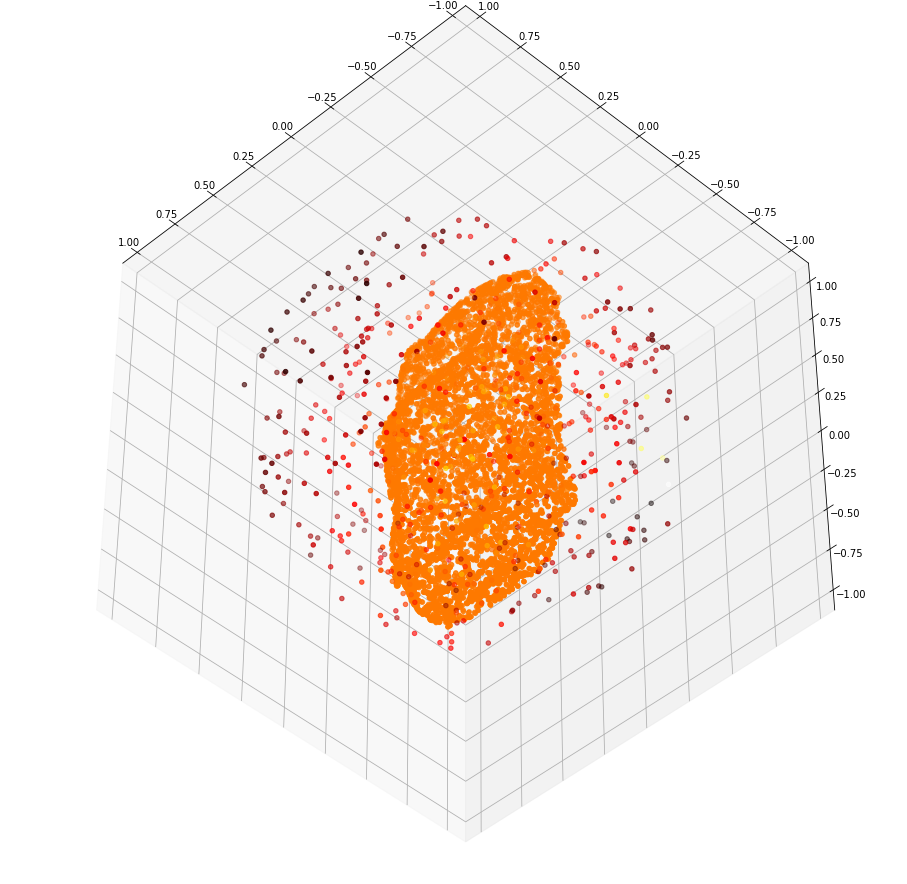

In [30]:
fig = plt.figure(figsize=(16, 16))
ax = fig.add_subplot(111, projection="3d")
ax.view_init(elev=-45, azim=135)
ax.scatter(points[:, 0], points[:, 1], zs=-points[:, 2], c=sdf, cmap="hot_r")

### Построение облака точек

In [31]:
# Mesh to pointcloud with normals in pytorch3d
num_points_to_sample = 40000

car_vert, car_norm = sample_points_from_meshes(
    car_mesh,
    num_points_to_sample ,
    return_normals=True
)

In [32]:
def plot_pointcloud(points, elev=70, azim=-70, title=""):
    # Sample points uniformly from the surface of the mesh.
    fig = plt.figure(figsize=(18, 9))
    ax = Axes3D(fig)
    x, y, z = points
    ax.scatter3D(x, z, -y,marker='.')  
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_zlabel('y')
    ax.set_title(title)
    ax.view_init(elev, azim)
    plt.show()

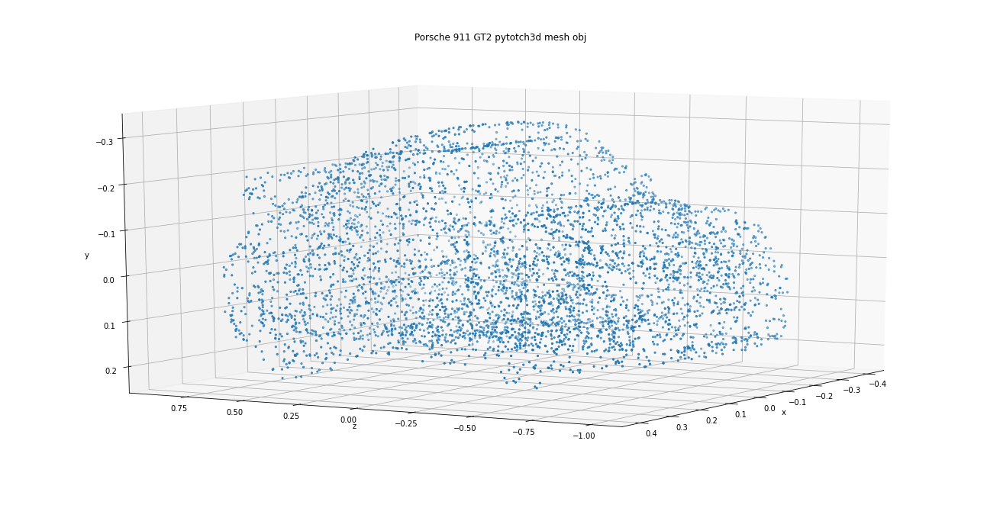

In [33]:
points = sample_points_from_meshes(car_mesh, 5000)
points = points.clone().detach().cpu().squeeze().unbind(1)
plot_pointcloud(points, elev=190, azim=150, title='Porsche 911 GT2 pytotch3d mesh obj')